# Cell type proportion analysis
Lingting Shi, Azizi lab, Columbia University

In [1]:
import anndata
import numpy as np
import pandas as pd
#from matplotlib_venn import venn2
from glob import glob

import scanpy as sc
import anndata as ad
import anndata
import pickle
import matplotlib.pyplot as plt

from tqdm import tqdm
import gc
import tarfile
#import scirpy as ir
import collections
from glob import glob
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import anndata
import pickle
import matplotlib.pyplot as plt
from tqdm import tqdm
import gc
import tarfile
#import community.community_louvain as community_louvain
import networkx as nx
from sklearn.neighbors import kneighbors_graph
from scipy import stats
import seaborn as sns
import collections
import random
from scipy.stats import zscore
#from kneed import KneeLocator
random.seed(10)





In [2]:
tcell_ann_concat = anndata.read('/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/anndata_file/tcell_ann_concat_Tcell_only_proportion.h5ad')

/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/__init__.py:52: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [3]:
tcell_ann_concat.obs['GVHD_Grade_1']

AAACCTGGTTGGAGGT-1      Mild
AAACCTGTCTATCCTA-1      Mild
AAACGGGAGGATGCGT-1      Mild
AAACGGGGTAAATGAC-1      Mild
AAAGATGCAAACTGTC-1      Mild
                        ... 
TGTTCCGAGGACAGCT-1        ND
TTAGGACGTTGTTTGG-1        ND
TTAGGACTCCCAAGAT-1        ND
TTCGAAGTCCGCATCT-1-1      ND
TTGCGTCCAAGAAAGG-1        ND
Name: GVHD_Grade_1, Length: 38766, dtype: category
Categories (4, object): ['Mild', 'ND', 'No', 'Severe']

In [4]:
tcell_ann_concat.obs['leiden_0.5']

AAACCTGGTTGGAGGT-1      CD4+ Central Memory T cells
AAACCTGTCTATCCTA-1            CD8+ Effector T cells
AAACGGGAGGATGCGT-1            CD8+ Effector T cells
AAACGGGGTAAATGAC-1            CD8+ Effector T cells
AAAGATGCAAACTGTC-1            CD8+ Effector T cells
                                   ...             
TGTTCCGAGGACAGCT-1            CD4+ Effector T cells
TTAGGACGTTGTTTGG-1                          Low CD3
TTAGGACTCCCAAGAT-1            CD4+ Effector T cells
TTCGAAGTCCGCATCT-1-1          CD4+ Effector T cells
TTGCGTCCAAGAAAGG-1            CD4+ Effector T cells
Name: leiden_0.5, Length: 38766, dtype: category
Categories (9, object): ['CD8+ Effector T cells', 'CD4+ Effector T cells', 'CD8+ Tissue Resident Memory T cells', 'CD4+ Central Memory T cells', ..., 'Low CD3', 'Proliferating CD8+ T cells', 'CD4+ Regulatory T cells', 'CD8+ Homeostatic Unconventional T cells']

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_80400/2261894872.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


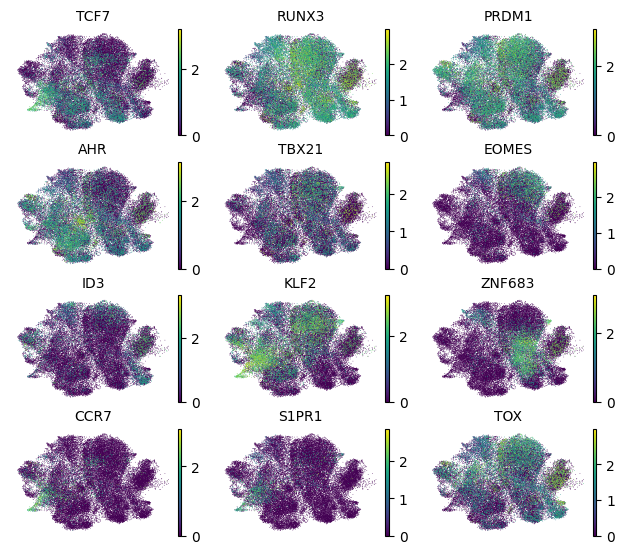

In [5]:
import matplotlib as mpl
mpl.rcParams['image.cmap'] = 'viridis'  # Or your preferred colormap
mpl.rcParams.update({'font.size': 10})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 10  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 10  # Colorbar tick label size
fig = sc.pl.umap(tcell_ann_concat, 
           color=['TCF7','RUNX3','PRDM1','AHR','TBX21','EOMES','ID3','KLF2','ZNF683','CCR7','S1PR1','TOX'],
           ncols=3,
          show = False,
          frameon=False,
          return_fig = True,
                size = 1)

fig.set_size_inches(7.5, 6)

plt.tight_layout()

# Save the figure at 300 DPI
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/Hobit_TFs.png", dpi=300, bbox_inches='tight')
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/Hobit_TFs.pdf", dpi=300, bbox_inches='tight')
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/Hobit_TFs.svg", dpi=300, bbox_inches='tight')
##ptionally, show the plot after saving
plt.show()

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_80400/1975489246.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


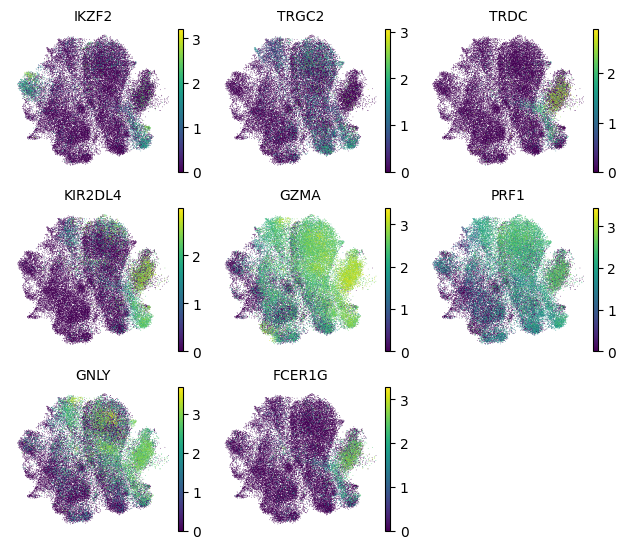

In [6]:
import matplotlib as mpl
mpl.rcParams['image.cmap'] = 'viridis'  # Or your preferred colormap
mpl.rcParams.update({'font.size': 10})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 10  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 10  # Colorbar tick label size
fig = sc.pl.umap(tcell_ann_concat, 
           color=["IKZF2", "TRGC2",'TRDC', "KIR2DL4", 'GZMA', 'PRF1', 'GNLY', 'FCER1G'],
           ncols=3,
          show = False,
          frameon=False,
          return_fig = True,
                size = 1)

fig.set_size_inches(7.5, 6)

plt.tight_layout()

# Save the figure at 300 DPI
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/unconventional_genes.png", dpi=300, bbox_inches='tight')
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/unconventional_genes.pdf", dpi=300, bbox_inches='tight')
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/unconventional_genes.svg", dpi=300, bbox_inches='tight')
##ptionally, show the plot after saving
plt.show()

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_80400/4104537598.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


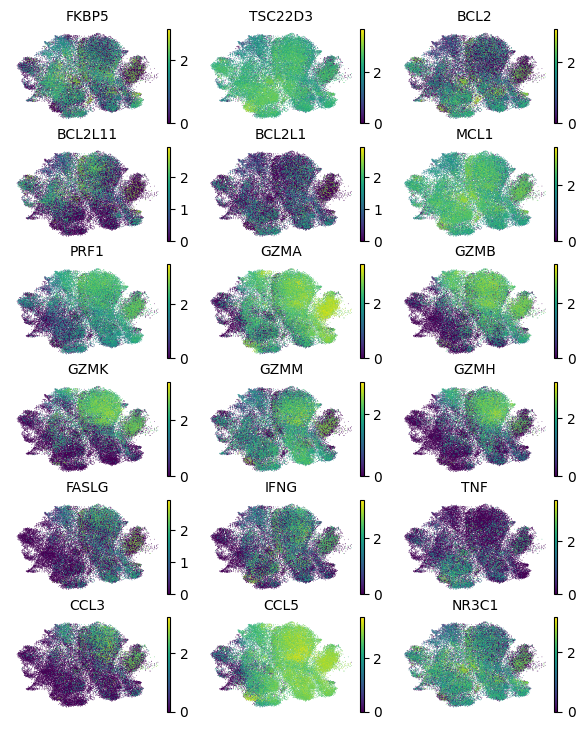

In [7]:

import matplotlib as mpl
mpl.rcParams['image.cmap'] = 'viridis'  # Or your preferred colormap
mpl.rcParams.update({'font.size': 10})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 10  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 10  # Colorbar tick label size
fig = sc.pl.umap(tcell_ann_concat, 
           color=['FKBP5', 'TSC22D3', 'BCL2', 'BCL2L11', 'BCL2L1', 'MCL1','PRF1', 'GZMA', 'GZMB', 'GZMK', 'GZMM', 'GZMH', 'FASLG', 'IFNG', 'TNF', 'CCL3', 'CCL5','NR3C1'
],
           ncols=3,
          show = False,
          frameon=False,
          return_fig = True,
                size = 1)

fig.set_size_inches(7, 8)

plt.tight_layout()

# Save the figure at 300 DPI
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/cytotoxic_genes.png", dpi=300, bbox_inches='tight')
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/cytotoxic_genes.pdf", dpi=300, bbox_inches='tight')
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/cytotoxic_genes.svg", dpi=300, bbox_inches='tight')
##ptionally, show the plot after saving
plt.show()

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_80400/4157924110.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


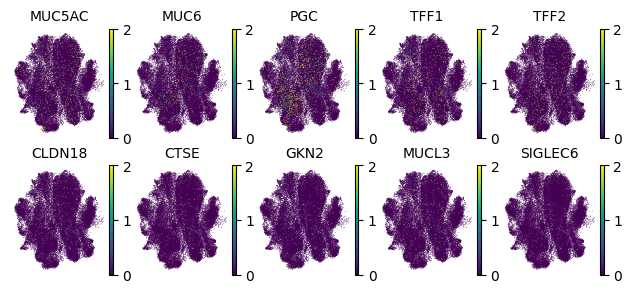

In [8]:
import matplotlib as mpl
mpl.rcParams['image.cmap'] = 'viridis'  # Or your preferred colormap
mpl.rcParams.update({'font.size': 10})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 10  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 10  # Colorbar tick label size
fig = sc.pl.umap(tcell_ann_concat, 
           color=['MUC5AC', 'MUC6', 'PGC', 'TFF1', 'TFF2', 'CLDN18', 'CTSE', 'GKN2', 'MUCL3', 'SIGLEC6'],
           ncols=5,
          show = False,
          frameon=False,
          vmin = 0,
          vmax = 2,
          return_fig = True,
                size = 1)

fig.set_size_inches(7.5, 3)

plt.tight_layout()

# Save the figure at 300 DPI
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/spatial_figures/Tcell_epi_overlap.png", dpi=300, bbox_inches='tight')
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/spatial_figures/Tcell_epi_overlap.pdf", dpi=300, bbox_inches='tight')
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/spatial_figures/Tcell_epi_overlap.svg", dpi=300, bbox_inches='tight')
##ptionally, show the plot after saving
plt.show()

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_80400/1712588964.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


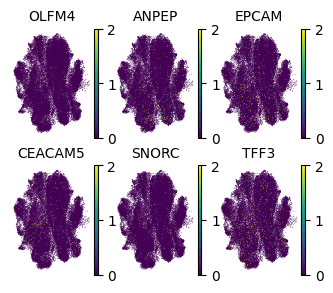

In [9]:
import matplotlib as mpl
mpl.rcParams['image.cmap'] = 'viridis'  # Or your preferred colormap
mpl.rcParams.update({'font.size': 10})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 10  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 10  # Colorbar tick label size
fig = sc.pl.umap(tcell_ann_concat, 
           color=['OLFM4','ANPEP','EPCAM','CEACAM5','SNORC','TFF3'],
           ncols=3,
          show = False,
          frameon=False,
          vmin = 0,
          vmax = 2,
          return_fig = True,
                size = 1)

fig.set_size_inches(3.75, 3)

plt.tight_layout()

# Save the figure at 300 DPI
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/spatial_figures/Tcell_ins_epi_overlap.png", dpi=300, bbox_inches='tight')
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/spatial_figures/Tcell_ins_epi_overlap.pdf", dpi=300, bbox_inches='tight')
fig.savefig("/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/spatial_figures/Tcell_ins_epi_overlap.svg", dpi=300, bbox_inches='tight')
##ptionally, show the plot after saving
plt.show()

In [10]:
sorter = ['ND001_ND','ND003_ND','C66_No','R085_No','C162_No','C160_No','C155_No','C160_Mild','C157_Mild','C179_Mild','C101_Mild','C162_Mild','C159_Severe','C152_Severe','C068_Severe','C98_Severe','C66_Severe']

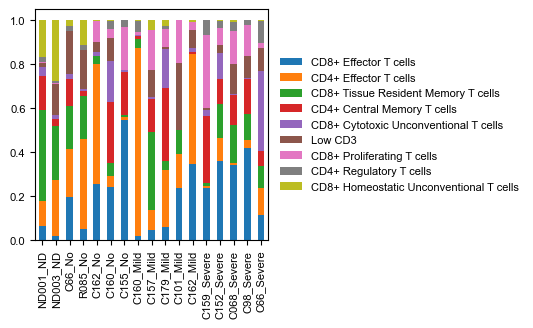

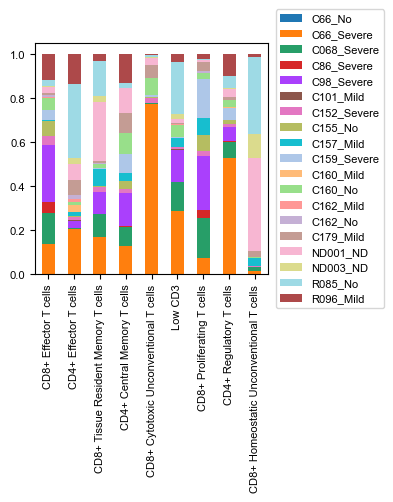

In [11]:
new_cluster_names = ['CD8+ Effector T cells','CD4+ Effector T cells','CD8+ Tissue Resident Memory T cells', "CD4+ Central Memory T cells","CD8+ Cytotoxic Unconventional T cells",'Low CD3',"CD8+ Proliferating T cells","CD4+ Regulatory T cells",'CD8+ Homeostatic Unconventional T cells'
]
tcell_ann_concat.rename_categories('leiden_0.5', new_cluster_names)
from copy import deepcopy
import matplotlib as mpl
# Update your existing rcParams
# Update your existing rcParams
mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (3, 3),  # Set default figure size to 3×3 inches
    'lines.linewidth': 1  # Set default line width to 1
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size
obs_1 = 'PatientID_Grade'
obs_2 = 'leiden_0.5'

n_categories = {x : len(tcell_ann_concat.obs[x].cat.categories) for x in [obs_1, obs_2]}
df = tcell_ann_concat.obs[[obs_2, obs_1]].values

obs2_clusters = tcell_ann_concat.obs[obs_2].cat.categories.tolist()
obs1_clusters = tcell_ann_concat.obs[obs_1].cat.categories.tolist()

obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i")
                   for k in obs1_clusters}
obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i")
                   for k in obs2_clusters}

for b, l in df:
  obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
  obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1

obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))

for i, k in enumerate(obs2_clusters):
  obs2_to_obs1_array[i, :] = deepcopy(obs2_to_obs1[k])
for i, k in enumerate(obs1_clusters):
  obs1_to_obs2_array[i, :] = deepcopy(obs1_to_obs2[k])

sums = np.sum(obs2_to_obs1_array, 0)
for col in range(np.size(obs2_to_obs1_array, 1)):
  for row in range(np.size(obs2_to_obs1_array, 0)):
    obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

sums2 = np.sum(obs1_to_obs2_array, 0)
for col in range(np.size(obs1_to_obs2_array, 1)):
  for row in range(np.size(obs1_to_obs2_array, 0)):
    obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]



df_obs2 = pd.DataFrame(obs2_to_obs1_array)
df_obs2.index = obs2_clusters
df_obs2.columns = obs1_clusters
df_obs2 = df_obs2.reindex(columns=sorter)

df_obs2.T.plot(kind="bar", stacked=True, color=tcell_ann_concat.uns[obs_2 + '_colors'], edgecolor='none')
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left', frameon=False)
plt.savefig('/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/cell_type_bar_plot.png', dpi=300, bbox_inches='tight', transparent = True)  # Save PNG
plt.savefig('/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/cell_type_bar_plot.pdf', dpi=300, bbox_inches='tight', transparent = True)  # Save PDF
plt.savefig('/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/cell_type_bar_plot.svg', dpi=300, bbox_inches='tight', transparent = True)  # Save PDF
plt.show()


df_obs1 = pd.DataFrame(obs1_to_obs2_array)
df_obs1.index = obs1_clusters
df_obs1.columns = obs2_clusters

df_obs1.T.plot(kind="bar", stacked=True,color=tcell_ann_concat.uns[obs_1 + '_colors'],edgecolor='none')
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
plt.savefig('/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/cell_type_bar_plot_2.png', dpi=300, bbox_inches='tight')  # Save PNG
plt.savefig('/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/cell_type_bar_plot_2.pdf', dpi=300, bbox_inches='tight')  # Save PDF
plt.show()

In [12]:
import matplotlib.pyplot as plt
import matplotlib.font_manager
from matplotlib import rcParams
import seaborn as sns
import statannotations
sns.set_style('white')

font_list = []
fpaths = matplotlib.font_manager.findSystemFonts()
for i in fpaths:
    try:
        f = matplotlib.font_manager.get_font(i)
        font_list.append(f.family_name)
    except RuntimeError:
        pass

font_list = set(font_list)
plot_font = 'Arial'

rcParams['font.family'] = plot_font
rcParams.update({'font.size': 15})
rcParams.update({'figure.dpi': 300})
rcParams.update({'figure.figsize': (4, 4)})
rcParams.update({'savefig.dpi': 300})

import warnings
warnings.filterwarnings('ignore')

In [13]:
tcell_ann_concat.obs['SampleID_Grade'] = tcell_ann_concat.obs['SampleID'].astype(str)+'_'+tcell_ann_concat.obs['GVHD_Grade_1'].astype(str)

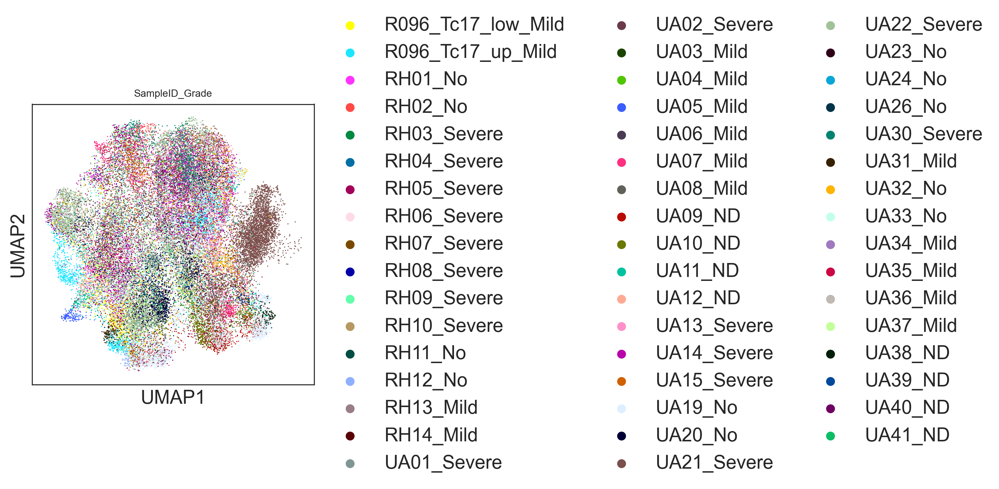

In [14]:
sc.pl.umap(tcell_ann_concat, color='SampleID_Grade')

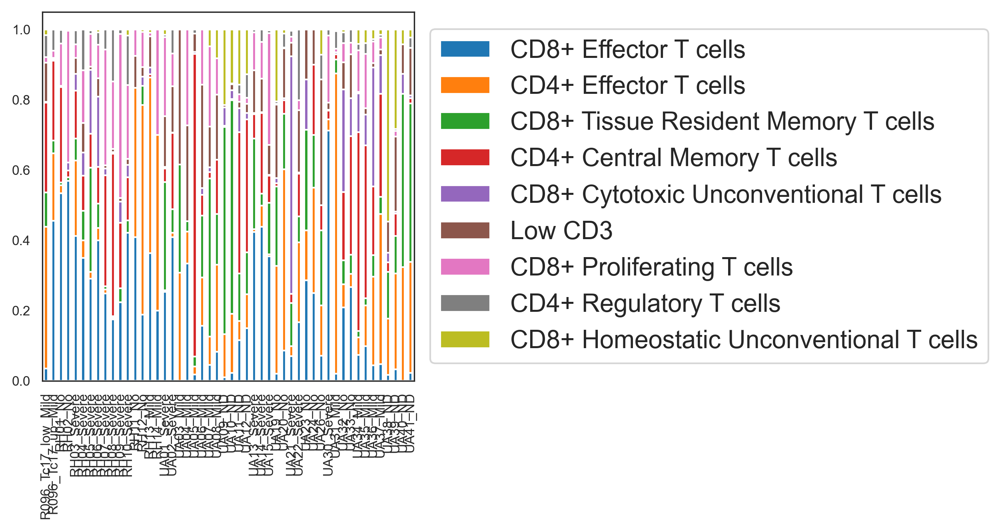

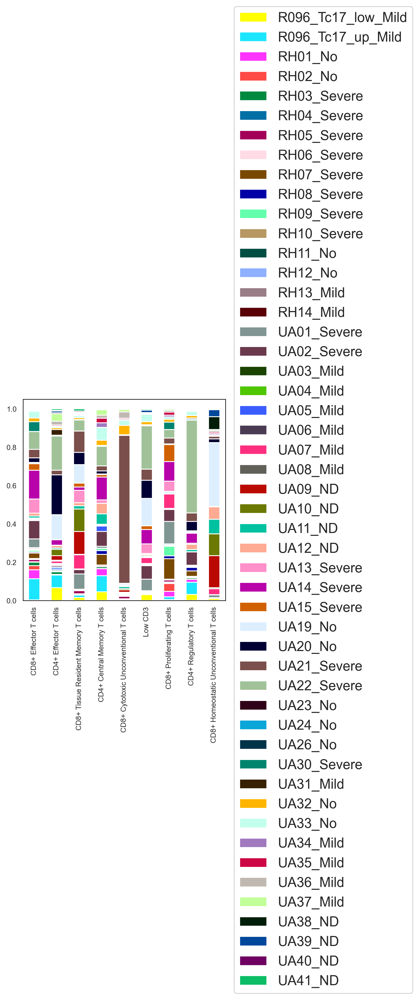

In [15]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy import stats
from copy import deepcopy
from statannotations.Annotator import Annotator

# Assuming adata is already defined and contains the necessary data
obs_1 = 'SampleID_Grade'
obs_2 = 'leiden_0.5'
num = 1

for adata in [tcell_ann_concat]:
    n_categories = {x: len(adata.obs[x].cat.categories) for x in [obs_1, obs_2]}
    df = adata.obs[[obs_2, obs_1]].values

    obs2_clusters = adata.obs[obs_2].cat.categories.tolist()
    obs1_clusters = adata.obs[obs_1].cat.categories.tolist()

    obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i")
                    for k in obs1_clusters}
    obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i")
                    for k in obs2_clusters}
    for b, l in df:
        obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
        obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1
    obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
    obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))
    for i, k in enumerate(obs2_clusters):
        obs2_to_obs1_array[i, :] = deepcopy(obs2_to_obs1[k])
    for i, k in enumerate(obs1_clusters):
        obs1_to_obs2_array[i, :] = deepcopy(obs1_to_obs2[k])

    sums = np.sum(obs2_to_obs1_array, 0)
    for col in range(np.size(obs2_to_obs1_array, 1)):
        for row in range(np.size(obs2_to_obs1_array, 0)):
            obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

    sums2 = np.sum(obs1_to_obs2_array, 0)
    for col in range(np.size(obs1_to_obs2_array, 1)):
        for row in range(np.size(obs1_to_obs2_array, 0)):
            obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

    df_obs2 = pd.DataFrame(obs2_to_obs1_array)
    df_obs2.index = obs2_clusters
    df_obs2.columns = obs1_clusters

    # Sort columns if necessary
    sorter = sorted(obs1_clusters)
    df_obs2 = df_obs2.reindex(columns=sorter)

    df_obs2.T.plot(kind="bar", stacked=True, color=tcell_ann_concat.uns[obs_2 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    df_obs1 = pd.DataFrame(obs1_to_obs2_array)
    df_obs1.index = obs1_clusters
    df_obs1.columns = obs2_clusters
    df_obs1.T.plot(kind="bar", stacked=True, color=tcell_ann_concat.uns[obs_1 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

In [16]:
new_cluster_names = ['CD8+ Effector T cells','CD4+ Effector T cells','CD8+ Tissue Resident \nMemory T cells', "CD4+ \nCentral Memory T cells","CD8+ Cytotoxic \nUnconventional T cells",'Low CD3',"Proliferating \nCD8+ T cells","CD4+ \nRegulatory T cells",'CD8+ Homeostatic \nUnconventional T cells ']
tcell_ann_concat.rename_categories('leiden_0.5', new_cluster_names)

In [17]:
df = pd.DataFrame({
    'cell_type': tcell_ann_concat.obs['leiden_0.5'],
    'grade': tcell_ann_concat.obs['GVHD_Grade_1'],
    'sample': tcell_ann_concat.obs['SampleID']
})

# Calculate percentages per sample
sample_percentages = pd.crosstab(
    [df['sample'], df['grade']], 
    df['cell_type'], 
    normalize='index'
) * 100

In [18]:
median_percentages = sample_percentages.groupby(level='grade').median()
median_percentages.T
df_obs2 = median_percentages.T
df_obs2

grade,Mild,ND,No,Severe
cell_type,,,,
CD8+ Effector T cells,7.305936,2.235853,25.000000,35.184478
CD4+ Effector T cells,24.742268,16.413635,14.285714,1.550180
CD8+ Tissue Resident \nMemory T cells,4.020101,29.269678,6.827309,6.834681
CD4+ \nCentral Memory T cells,15.463918,2.133095,3.787549,11.275278
CD8+ Cytotoxic \nUnconventional T cells,0.578035,2.627753,1.458941,1.250328
Low CD3,5.202312,5.541142,10.000000,4.849592
Proliferating \nCD8+ T cells,6.192661,0.046168,3.317536,12.883533
CD4+ \nRegulatory T cells,0.688073,0.313548,0.666945,3.504693
CD8+ Homeostatic \nUnconventional T cells,0.980392,15.542232,0.144300,0.080060


In [19]:
normalized_data = df_obs2 / df_obs2.sum(axis=0)
df_obs2 = normalized_data 

# Figure 4G

Sum of No before closing the polygon: 0.9999999999999998
Sum of Mild before closing the polygon: 0.9999999999999998
Sum of Severe before closing the polygon: 0.9999999999999998


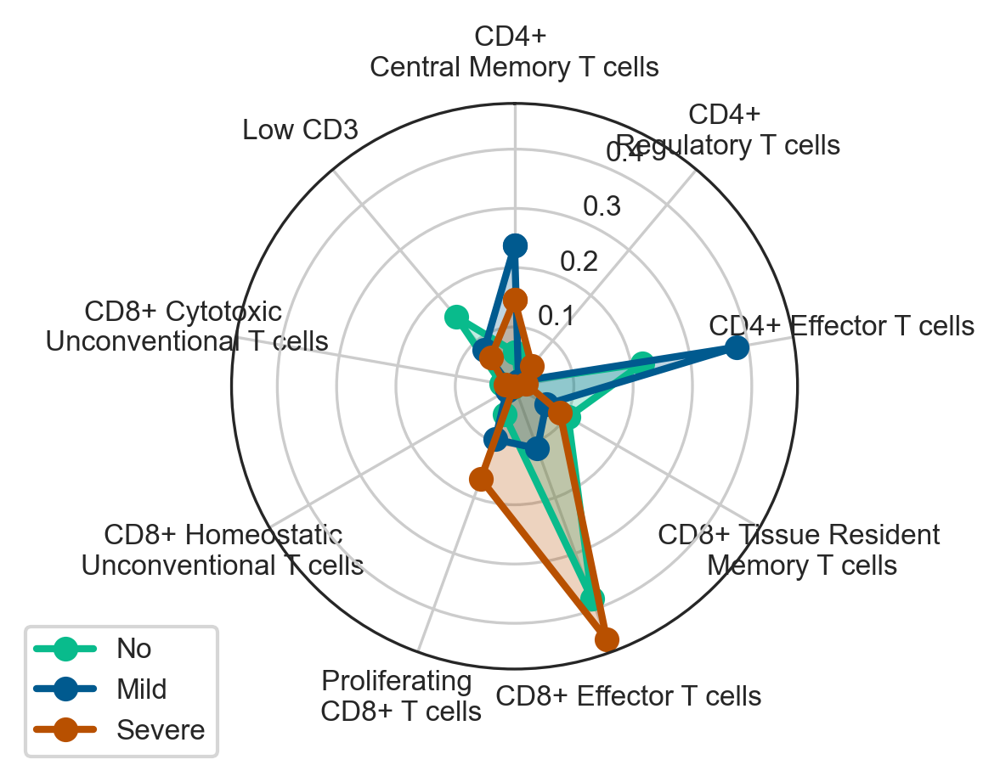

In [20]:
import matplotlib as mpl
# Update your existing rcParams
# Update your existing rcParams
mpl.rcParams.update({
    'svg.fonttype': 'none',
    'font.family': 'Arial',
})

mpl.rcParams.update({
    'font.size': 10,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
})

mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['axes.labelsize'] = 8
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size
mpl.rcParams['legend.fontsize'] = 8     # For legend text

def create_radar_plot(df, title="T Cell Subset Distribution"):
    # Define the desired order of cell types
    ordered_cell_types = [
        'CD4+ \nCentral Memory T cells',
        'CD4+ \nRegulatory T cells',
        'CD4+ Effector T cells',
        'CD8+ Tissue Resident \nMemory T cells',
        'CD8+ Effector T cells',
        'Proliferating \nCD8+ T cells',
        'CD8+ Homeostatic \nUnconventional T cells ',
        'CD8+ Cytotoxic \nUnconventional T cells',
        'Low CD3'
    ]

    grade_order = ['No', 'Mild', 'Severe']
    
    # Reorder the DataFrame
    df = df.reindex(ordered_cell_types)
    df = df[grade_order]  # Reorder columns according to grade order
    
    # Rest of your original code remains the same
    categories = df.index.tolist()
    num_vars = len(categories)
    angles = [n / float(num_vars) * 2 * np.pi for n in range(num_vars)]
    angles += angles[:1]
    
    fig, ax = plt.subplots(figsize=(4, 4), subplot_kw=dict(projection='polar'))
    
    colors = {'No': '#09BB8C', 'Mild': '#005A8F', 'Severe': '#B85000'}
    alphas = {'No': 0.25, 'Mild': 0.25, 'Severe': 0.25}
    
    for column in df.columns:
        values = df[column].values.tolist()
        print(f"Sum of {column} before closing the polygon: {np.sum(values)}")
        values += values[:1]
        ax.plot(angles, values, 'o-', linewidth=2, label=column, 
                color=colors[column])
        ax.fill(angles, values, alpha=alphas[column], color=colors[column])
    
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.grid(True)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories)
    ax.legend(loc='upper right', bbox_to_anchor=(0, 0.1))
    
    #plt.title(title, y=1.05)
    return fig

# Create and save the plot
fig = create_radar_plot(df_obs2)
plt.tight_layout()
plt.savefig('/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/radar_plot_median.pdf', bbox_inches='tight', dpi=300, transparent = True)
plt.savefig('/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/radar_plot_median.png', bbox_inches='tight', dpi=300, transparent = True)
plt.savefig('/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/radar_plot_median.svg', bbox_inches='tight', dpi=300, transparent = True)
plt.show()

In [21]:
new_cluster_names = ['CD8+ Effector T cells','CD4+ Effector T cells','CD8+ Tissue Resident Memory T cells', "CD4+ Central Memory T cells","CD8+ Cytotoxic Unconventional T cells",'Low CD3',"CD8+ Proliferating T cells","CD4+ Regulatory T cells",'CD8+ Homeostatic Unconventional T cells ']
tcell_ann_concat.rename_categories('leiden_0.5', new_cluster_names)
cd8_columns = ['CD8+ Effector T cells','CD8+ Tissue Resident Memory T cells','CD8+ Cytotoxic Unconventional T cells','CD8+ Proliferating T cells','CD8+ Homeostatic Unconventional T cells ','Low CD3']
cd4_columns = ['CD4+ Regulatory T cells', 'CD4+ Effector T cells','CD4+ Central Memory T cells',]

In [22]:
tcell_ann_concat.obs['leiden_48'] = tcell_ann_concat.obs['leiden_0.5'].apply(
    lambda x: 'CD4' if x in cd4_columns else 'CD8'
)

tcell_ann_concat.obs['leiden_48'] = tcell_ann_concat.obs['leiden_48'].astype('category')

In [23]:
ptcy = ['C155','C101','C162','C160']

tcell_ann_concat.obs['ptcy'] = 'NoP'
tcell_ann_concat.obs.loc[tcell_ann_concat.obs['PatientID'].isin(ptcy),'ptcy'] = "Ptcy"

tcell_ann_concat.obs['PatientID_Grade_Ptcy'] = tcell_ann_concat.obs['PatientID'].astype(str)+'_'+tcell_ann_concat.obs['GVHD_Grade_1'].astype(str)+'_'+tcell_ann_concat.obs['ptcy'].astype(str)

tcell_ann_concat.obs['PatientID_Grade_Ptcy']=tcell_ann_concat.obs['PatientID_Grade_Ptcy'].astype("category")

tcell_ann_concat.obs['SampleID_Ptcy'] = tcell_ann_concat.obs['SampleID'].astype(str)+'_'+tcell_ann_concat.obs['ptcy'].astype(str)

tcell_ann_concat.obs['SampleID_Ptcy']=tcell_ann_concat.obs['SampleID_Ptcy'].astype("category")

tcell_ann_concat.obs['SampleID_Tissue_Location'] = tcell_ann_concat.obs['SampleID'].astype(str)+'_'+tcell_ann_concat.obs['Tissue_Location'].astype(str)

tcell_ann_concat.obs['SampleID_Tissue_Location']=tcell_ann_concat.obs['SampleID_Tissue_Location'].astype("category")

tcell_ann_concat_Upper = tcell_ann_concat[tcell_ann_concat.obs['Tissue_Location'] == 'Upper GI']

tcell_ann_concat_Upper_LP = tcell_ann_concat_Upper[tcell_ann_concat_Upper.obs['LPorIE'] == 'Lamina Propria Cells']
tcell_ann_concat_Upper_IE = tcell_ann_concat_Upper[tcell_ann_concat_Upper.obs['LPorIE'] == 'Intraepithelial Cells']

tcell_ann_concat_Lower = tcell_ann_concat[tcell_ann_concat.obs['Tissue_Location'] == 'Lower GI']
tcell_ann_concat_Lower_LP = tcell_ann_concat_Lower[tcell_ann_concat_Lower.obs['LPorIE'] == 'Lamina Propria Cells']
tcell_ann_concat_Lower_IE = tcell_ann_concat_Lower[tcell_ann_concat_Lower.obs['LPorIE'] == 'Intraepithelial Cells']

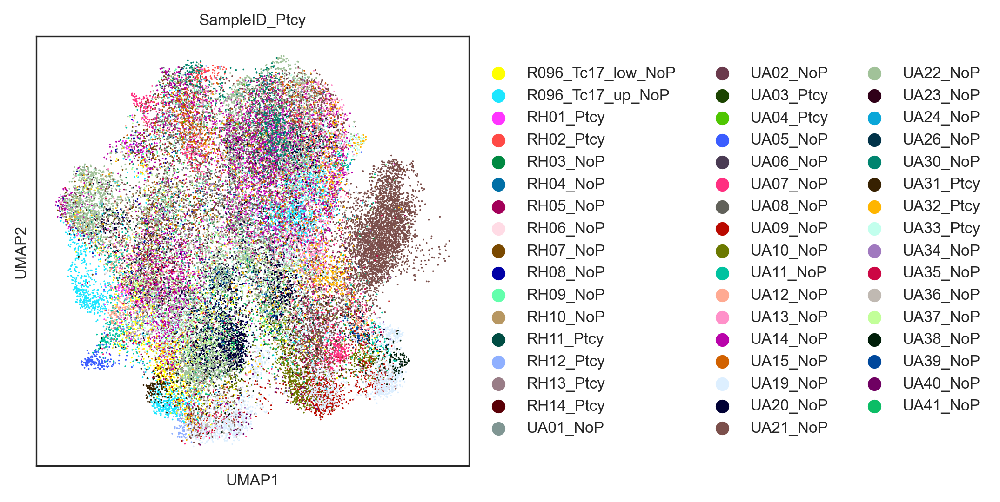

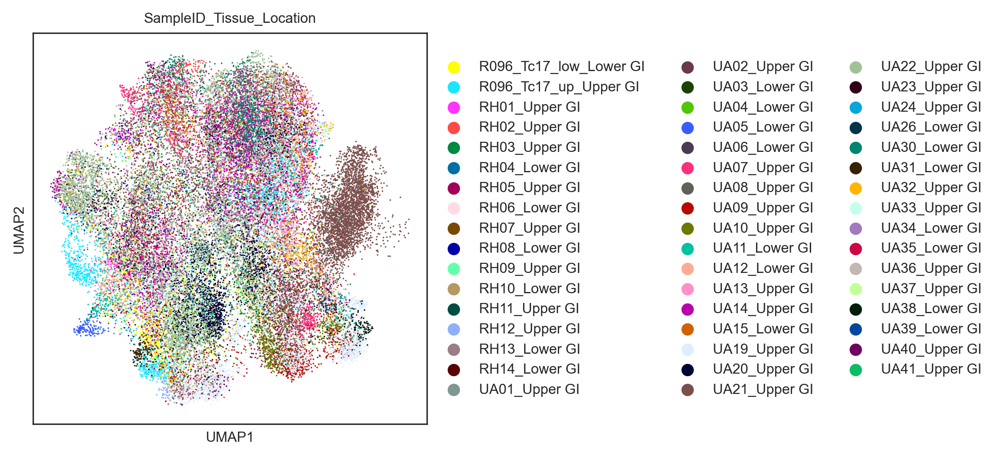

In [24]:
sc.pl.umap(tcell_ann_concat, color = ['SampleID_Ptcy'])
sc.pl.umap(tcell_ann_concat, color = ['SampleID_Tissue_Location'])


In [25]:
###### Filter out samples with low cell count
# Calculate cell counts per sample
cell_counts = tcell_ann_concat.obs['SampleID'].value_counts()

# Get samples with at least 100 cells
valid_samples = cell_counts[cell_counts >= 100].index

# Subset AnnData to retain only valid samples
tcell_ann_concat_f = tcell_ann_concat[tcell_ann_concat.obs['SampleID'].isin(valid_samples), :]

# Verify filtering
print(f"Remaining samples: {tcell_ann_concat_f.obs['SampleID'].nunique()}")
print(f"Remaining cells: {tcell_ann_concat_f.n_obs}")

Remaining samples: 38
Remaining cells: 38267


In [26]:
new_cluster_names = ['CD8+ Effector T cells','CD4+ Effector T cells','CD8+ Tissue Resident Memory T cells', "CD4+ Central Memory T cells","CD8+ Cytotoxic Unconventional T cells",'Low CD3',"CD8+ Proliferating T cells","CD4+ Regulatory T cells",'CD8+ Homeostatic Unconventional T cells ']
tcell_ann_concat_f.rename_categories('leiden_0.5', new_cluster_names)

# Figure 4

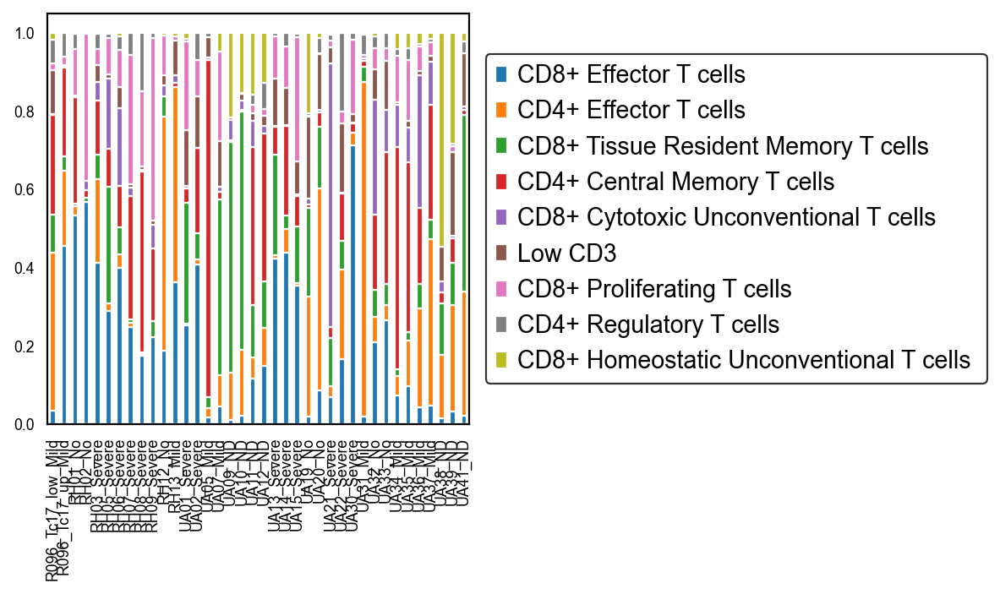

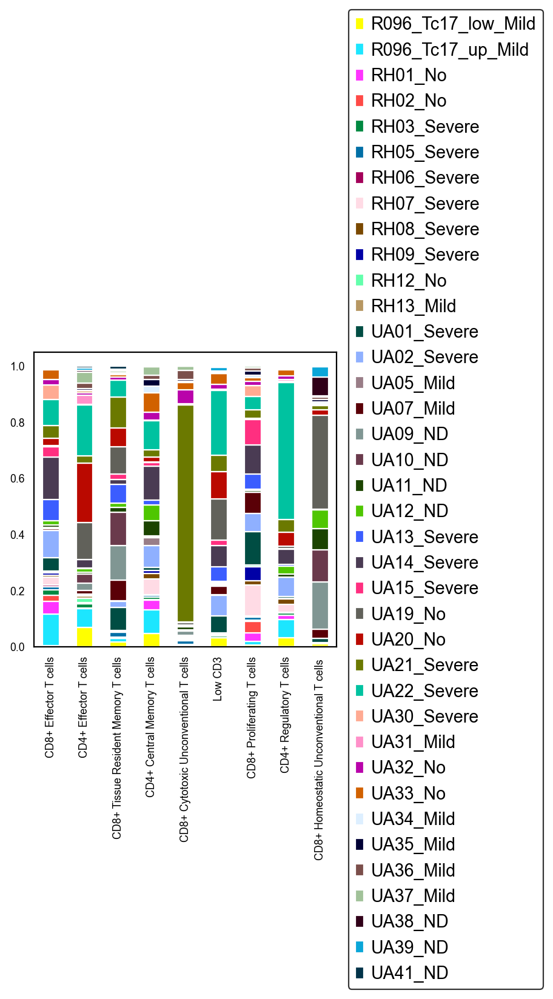

1
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.207e-01 U_stat=4.300e+01
mild vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:3.641e-01 U_stat=8.600e+01
no vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.753e-01 U_stat=6.800e+01
Raw p-values: [0.12073854334140409, 0.17527213921127915, 0.3640964293652711]
Holm-corrected p-values: [0.36221563 0.36221563 0.36409643]
('no', 'mild'): corrected p = 0.362216 (not significant)
('no', 'severe'): corrected p = 0.362216 (not significant)
('mild', 'severe'): corrected p = 0.364096 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


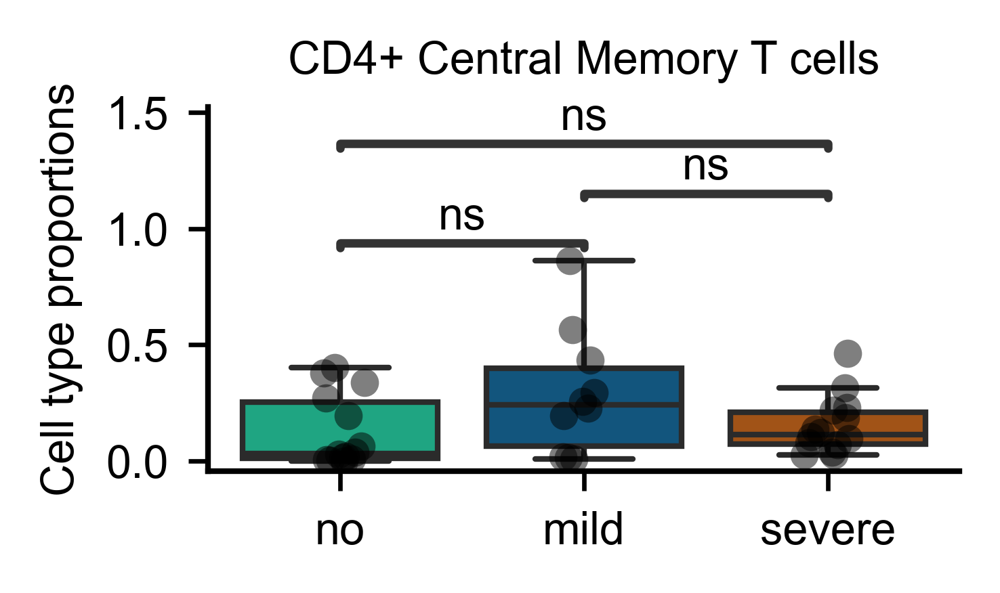

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:8.376e-01 U_stat=7.400e+01
mild vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:6.474e-03 U_stat=2.300e+01
no vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:9.430e-03 U_stat=4.100e+01
Raw p-values: [0.8376197722836831, 0.009430400901824194, 0.006473883367260929]
Holm-corrected p-values: [0.83761977 0.01942165 0.01942165]
('no', 'mild'): corrected p = 0.837620 (not significant)
('no', 'severe'): corrected p = 0.019422 (significant)
('mild', 'severe'): corrected p = 0.019422 (significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


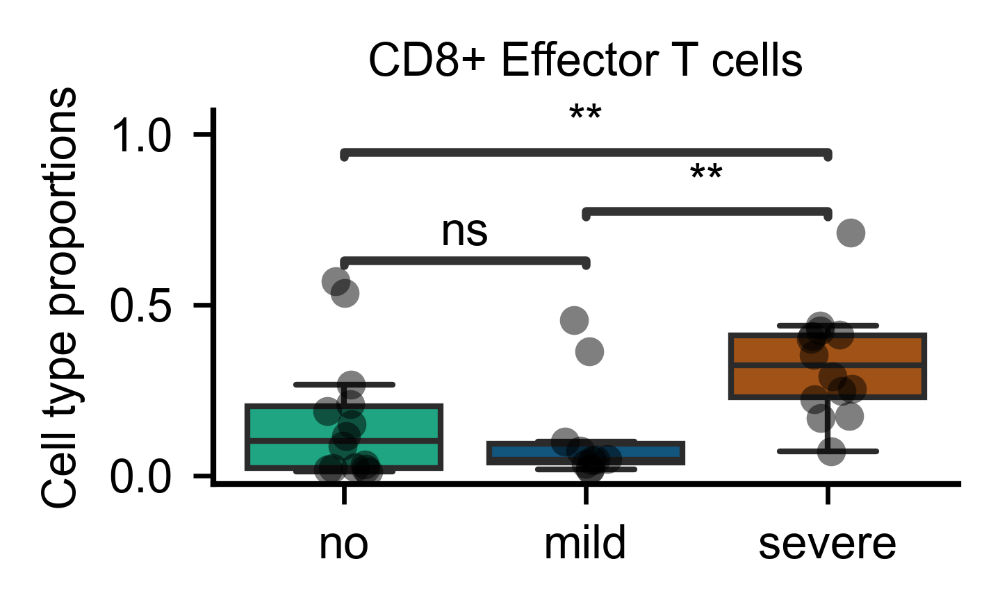

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:4.292e-01 U_stat=5.600e+01
mild vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.417e-03 U_stat=1.250e+02
no vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:4.384e-03 U_stat=1.605e+02
Raw p-values: [0.4292480471436786, 0.004383675099917517, 0.001416864815727363]
Holm-corrected p-values: [0.42924805 0.00876735 0.00425059]
('no', 'mild'): corrected p = 0.429248 (not significant)
('no', 'severe'): corrected p = 0.008767 (significant)
('mild', 'severe'): corrected p = 0.004251 (significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


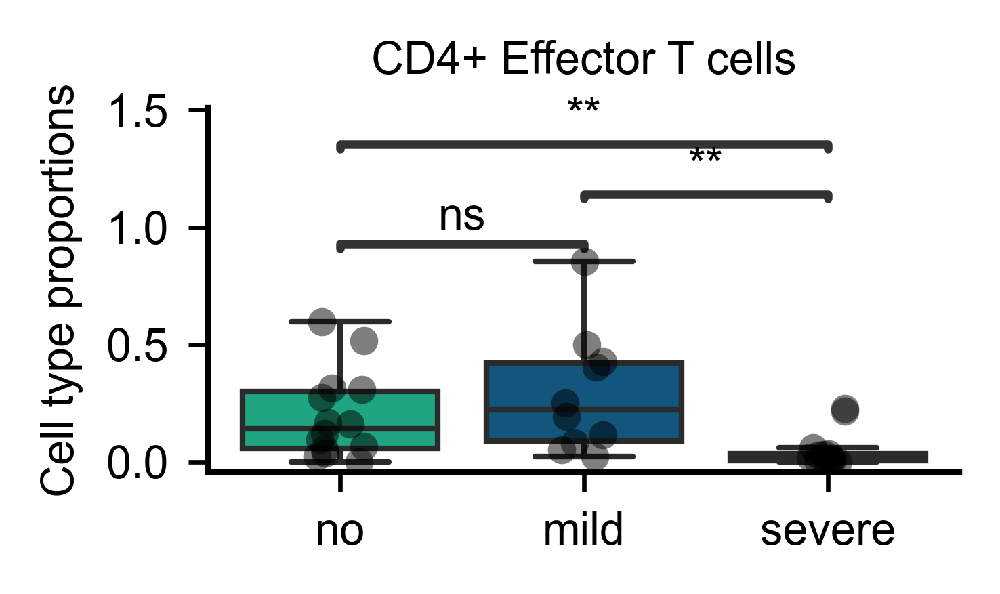

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:2.811e-02 (ns) U_stat=1.080e+02
mild vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:3.194e-01 U_stat=5.250e+01
no vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:2.413e-01 U_stat=1.240e+02
Raw p-values: [0.02810804014715179, 0.24133124222644808, 0.3194277460688454]
Holm-corrected p-values: [0.08432412 0.48266248 0.48266248]
('no', 'mild'): corrected p = 0.084324 (not significant)
('no', 'severe'): corrected p = 0.482662 (not significant)
('mild', 'severe'): corrected p = 0.482662 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


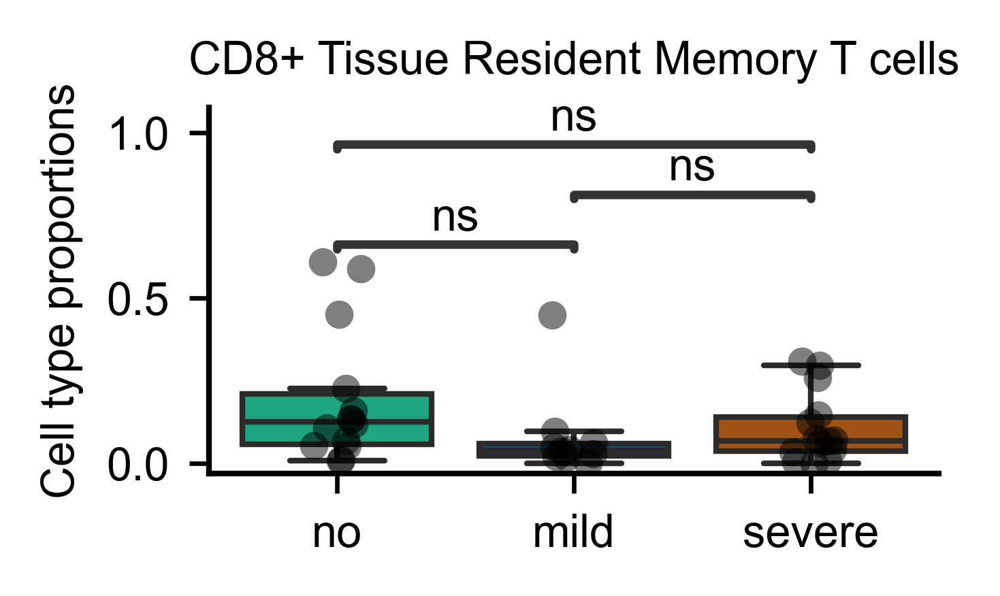

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:5.764e-01 U_stat=6.000e+01
mild vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:3.339e-01 U_stat=5.300e+01
no vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:7.673e-02 U_stat=5.900e+01
Raw p-values: [0.5763682098593368, 0.07673468334466262, 0.33386848851216644]
Holm-corrected p-values: [0.66773698 0.23020405 0.66773698]
('no', 'mild'): corrected p = 0.667737 (not significant)
('no', 'severe'): corrected p = 0.230204 (not significant)
('mild', 'severe'): corrected p = 0.667737 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


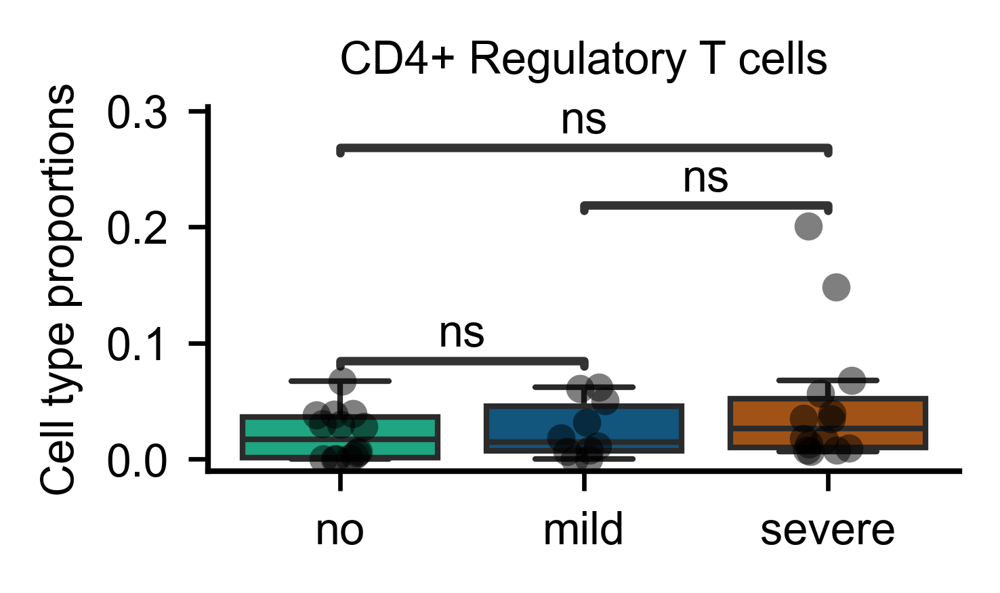

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:3.478e-01 U_stat=5.350e+01
mild vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:3.258e-02 (ns) U_stat=3.300e+01
no vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:3.508e-03 U_stat=3.400e+01
Raw p-values: [0.3477782913364119, 0.0035084546973605454, 0.03258000778750235]
Holm-corrected p-values: [0.34777829 0.01052536 0.06516002]
('no', 'mild'): corrected p = 0.347778 (not significant)
('no', 'severe'): corrected p = 0.010525 (significant)
('mild', 'severe'): corrected p = 0.065160 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


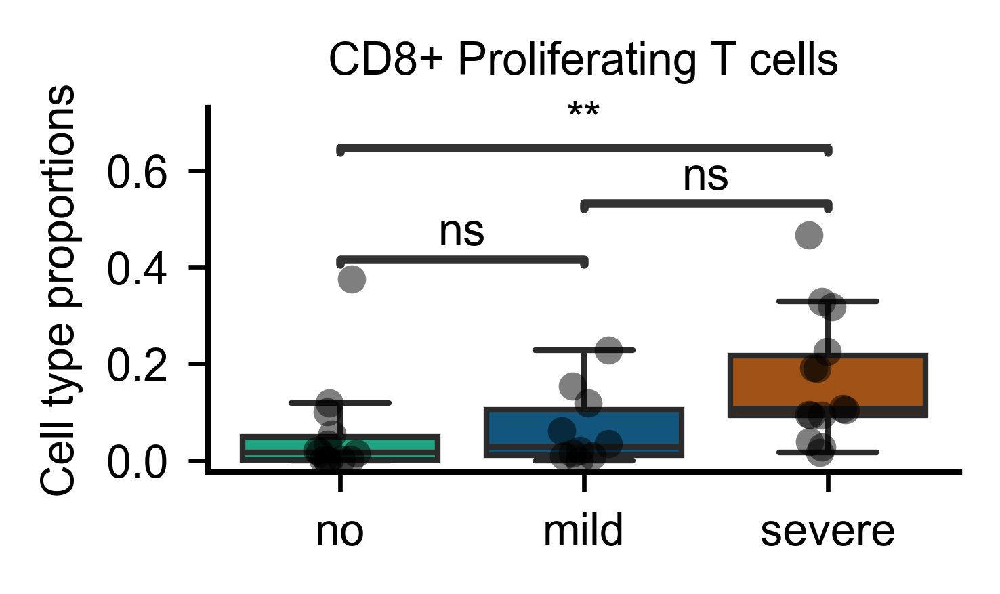

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:8.836e-01 U_stat=7.300e+01
mild vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:3.055e-01 U_stat=8.800e+01
no vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:2.234e-01 U_stat=1.250e+02
Raw p-values: [0.8836174593813683, 0.22337087356959373, 0.30550708686125383]
Holm-corrected p-values: [0.88361746 0.67011262 0.67011262]
('no', 'mild'): corrected p = 0.883617 (not significant)
('no', 'severe'): corrected p = 0.670113 (not significant)
('mild', 'severe'): corrected p = 0.670113 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


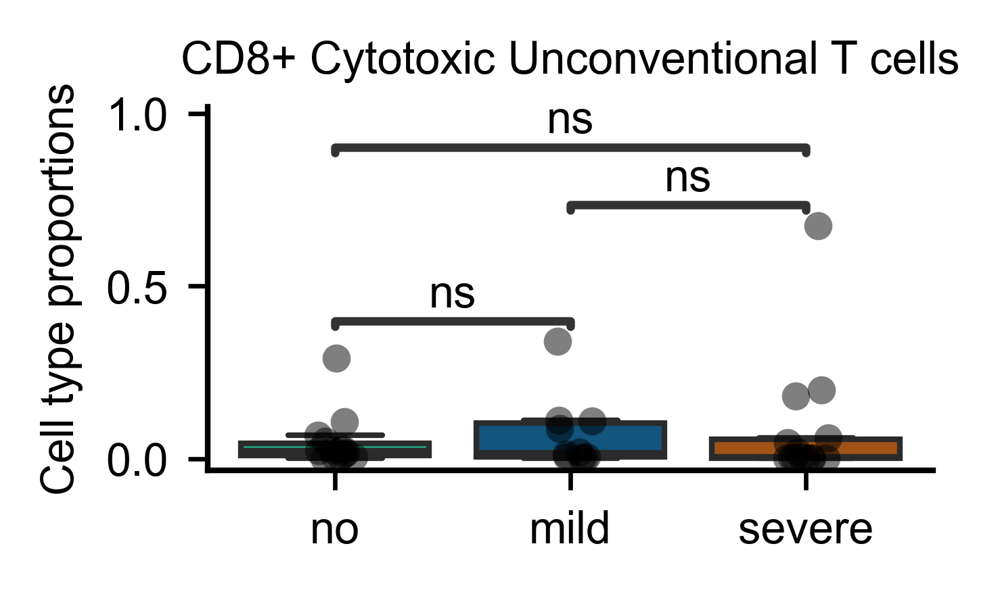

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.976e-01 U_stat=9.250e+01
mild vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:2.081e-01 U_stat=4.800e+01
no vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.000e+00 U_stat=9.800e+01
Raw p-values: [0.19758302162647057, 1.0, 0.20806244620945058]
Holm-corrected p-values: [0.59274906 1.         0.59274906]
('no', 'mild'): corrected p = 0.592749 (not significant)
('no', 'severe'): corrected p = 1.000000 (not significant)
('mild', 'severe'): corrected p = 0.592749 (not significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


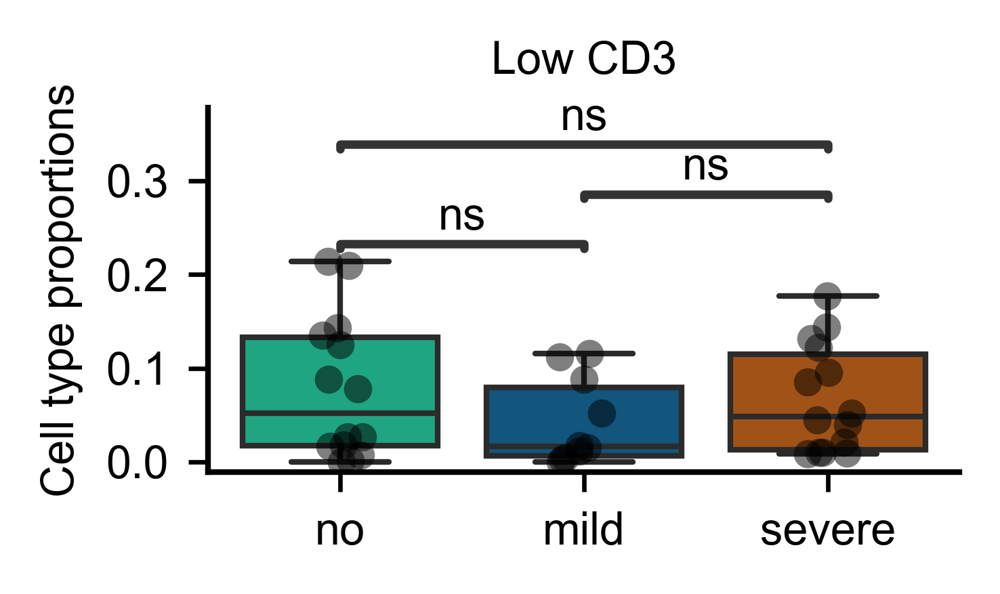

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:2.525e-01 U_stat=9.000e+01
mild vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:9.918e-03 U_stat=1.140e+02
no vs. severe: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:3.279e-03 U_stat=1.620e+02
Raw p-values: [0.25250198386744727, 0.003278991793491504, 0.009917708372777919]
Holm-corrected p-values: [0.25250198 0.00983698 0.01983542]
('no', 'mild'): corrected p = 0.252502 (not significant)
('no', 'severe'): corrected p = 0.009837 (significant)
('mild', 'severe'): corrected p = 0.019835 (significant)
Number of samples per condition:
Grade
no        14
severe    14
mild      10
Name: count, dtype: int64


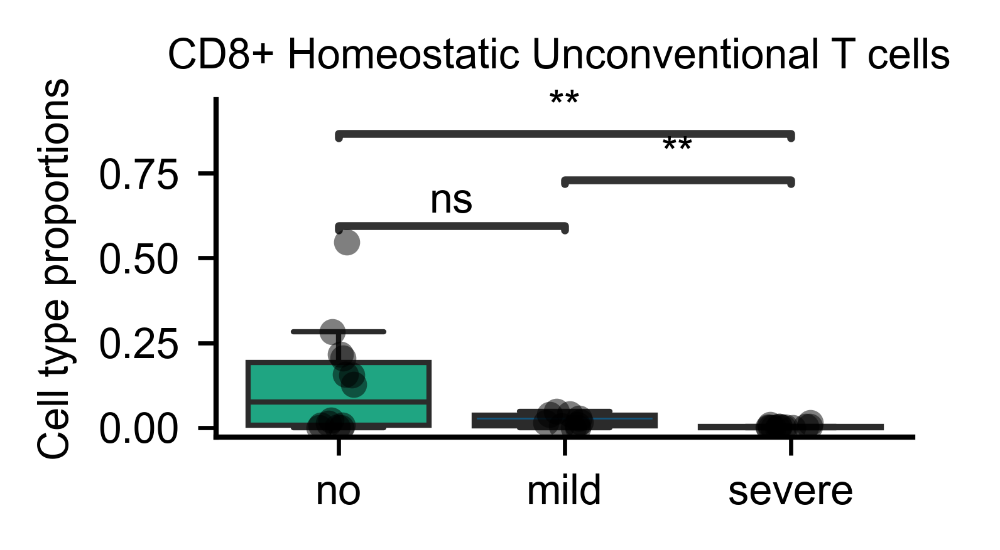

In [27]:
from matplotlib import rcParams
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator  # Assuming you use statannotations for the p-values

import matplotlib as mpl
sc.settings.set_figure_params(dpi_save=300)
mpl.rcParams['axes.linewidth'] = 1 
mpl.rcParams['axes.grid'] = False  # Disable grid lines
# Set all text elements to black color
mpl.rcParams['text.color'] = 'black'
mpl.rcParams['axes.labelcolor'] = 'black'
mpl.rcParams['xtick.color'] = 'black'
mpl.rcParams['ytick.color'] = 'black'
mpl.rcParams['axes.titlecolor'] = 'black'
mpl.rcParams['legend.facecolor'] = 'white'
mpl.rcParams['legend.edgecolor'] = 'black'
mpl.rcParams['legend.labelcolor'] = 'black'
mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
})

mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['axes.labelsize'] = 8
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size

# Assuming adata is already defined and contains the necessary data
obs_1 = 'SampleID_Grade'
obs_2 = 'leiden_0.5'
num = 1

for adata in [tcell_ann_concat_f]:
    n_categories = {x: len(adata.obs[x].cat.categories) for x in [obs_1, obs_2]}
    df = adata.obs[[obs_2, obs_1]].values

    obs2_clusters = adata.obs[obs_2].cat.categories.tolist()
    obs1_clusters = adata.obs[obs_1].cat.categories.tolist()

    obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i")
                    for k in obs1_clusters}
    obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i")
                    for k in obs2_clusters}
    for b, l in df:
        obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
        obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1
    obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
    obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))
    for i, k in enumerate(obs2_clusters):
        obs2_to_obs1_array[i, :] = deepcopy(obs2_to_obs1[k])
    for i, k in enumerate(obs1_clusters):
        obs1_to_obs2_array[i, :] = deepcopy(obs1_to_obs2[k])

    sums = np.sum(obs2_to_obs1_array, 0)
    for col in range(np.size(obs2_to_obs1_array, 1)):
        for row in range(np.size(obs2_to_obs1_array, 0)):
            obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

    sums2 = np.sum(obs1_to_obs2_array, 0)
    for col in range(np.size(obs1_to_obs2_array, 1)):
        for row in range(np.size(obs1_to_obs2_array, 0)):
            obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

    df_obs2 = pd.DataFrame(obs2_to_obs1_array)
    df_obs2.index = obs2_clusters
    df_obs2.columns = obs1_clusters

    # Sort columns if necessary
    sorter = sorted(obs1_clusters)
    df_obs2 = df_obs2.reindex(columns=sorter)

    df_obs2.T.plot(kind="bar", stacked=True, color=tcell_ann_concat.uns[obs_2 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    df_obs1 = pd.DataFrame(obs1_to_obs2_array)
    df_obs1.index = obs1_clusters
    df_obs1.columns = obs2_clusters
    df_obs1.T.plot(kind="bar", stacked=True, color=tcell_ann_concat.uns[obs_1 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    print(num)
    num += 1
    p_list = []

    for i in adata.obs['leiden_0.5'].unique():
        substring = 'Severe'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_severe = df_obs2.loc[:, column_mask]
        severe = selected_columns_severe.loc[i].values[~np.isnan(selected_columns_severe.loc[i].values)]

        substring = 'Mild'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_mild = df_obs2.loc[:, column_mask]
        mild = selected_columns_mild.loc[i].values[~np.isnan(selected_columns_mild.loc[i].values)]

        substring = 'No'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_no = df_obs2.loc[:, column_mask]
        no = selected_columns_no.loc[i].values[~np.isnan(selected_columns_no.loc[i].values)]

        substring = 'Treated'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_treated = df_obs2.loc[:, column_mask]
        treated = selected_columns_treated.loc[i].values[~np.isnan(selected_columns_treated.loc[i].values)]


        substring = 'ND'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_nd = df_obs2.loc[:, column_mask]
        nd = selected_columns_nd.loc[i].values[~np.isnan(selected_columns_nd.loc[i].values)]

        
        df_severe = pd.DataFrame()
        df_severe['Value'] = severe
        df_severe['Grade'] = 'severe'

        df_mild = pd.DataFrame()
        df_mild['Value'] = mild
        df_mild['Grade'] = 'mild'

        df_no = pd.DataFrame()
        df_no['Value'] = no
        df_no['Grade'] = 'no'

        df_treated = pd.DataFrame()
        df_treated['Value'] = treated
        df_treated['Grade'] = 'no'

        df_ND = pd.DataFrame()
        df_ND['Value'] = nd
        df_ND['Grade'] = 'no'
        

        palette = {'no': '#09BB8C', 'mild': '#005A8F', 'severe': '#B85000'}

        result = pd.concat([df_no, df_treated, df_ND,df_mild, df_severe])
        fig, ax = plt.subplots(figsize=(2.5, 1.5), dpi=300)
        sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=palette, order=['no', 'mild', 'severe'], showfliers=False)
        sns.stripplot(x='Grade', y='Value', data=result, ax=ax, color='black', alpha=0.5, jitter=True, order=['no', 'mild', 'severe'])

        ax.spines[['right', 'top']].set_visible(False)
        ax.set_xlabel('')
        ax.set_ylabel('Cell type proportions')
        ax.set_title(i)
        ax.get_xaxis().tick_bottom()
        ax.get_yaxis().tick_left()

        pairs = [('no', 'mild'), ('no', 'severe'),('mild', 'severe')]
        annotator = Annotator(ax, pairs, data=result, x='Grade', y='Value')
        #annotator.configure(test='Kruskal')
        annotator.configure(test='Mann-Whitney', comparisons_correction="holm", correction_format="replace")
        annotator.apply_and_annotate()
        plt.tight_layout()

                # After your annotation code, print the actual corrected p-values
        from statsmodels.stats.multitest import multipletests
        
        # Calculate manually to verify
        pvals_raw = []
        for pair in pairs:
            group1 = result[result['Grade'] == pair[0]]['Value'] 
            group2 = result[result['Grade'] == pair[1]]['Value']
            _, pval = stats.mannwhitneyu(group1, group2, alternative='two-sided')
            pvals_raw.append(pval)
        
        # Apply Holm correction
        corrected_pvals = multipletests(pvals_raw, method='holm')[1]
        
        print("Raw p-values:", pvals_raw)
        print("Holm-corrected p-values:", corrected_pvals)
        
        # Check significance at α = 0.05
        for i, pair in enumerate(pairs):
            significance = "significant" if corrected_pvals[i] < 0.05 else "not significant"
            print(f"{pair}: corrected p = {corrected_pvals[i]:.6f} ({significance})")

        sample_counts = result['Grade'].value_counts()
        print("Number of samples per condition:")
        print(sample_counts)

        # Save figure with 300 DPI
        plt.savefig(f'/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/fig_{i}_boxplot_300dpi.png', dpi=300, transparent = True)
        plt.savefig(f'/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/fig_{i}_boxplot_300dpi.pdf', dpi=300, transparent = True)
        plt.savefig(f'/Users/lingting/Documents/GVHD_project/Paper_ready_pipeline/Figures/single_cell_figures/fig_{i}_boxplot_300dpi.svg', dpi=300, transparent = True)

        plt.show()